## Visualization of CNN: Grad-CAM
* **Objective**: Convolutional Neural Networks are widely used on computer vision. It is powerful for processing grid-like data. However we hardly know how and why it works, due to the lack of decomposability into individually intuitive components. In this assignment, we use Grad-CAM, which highlights the regions of the input image that were important for the neural network prediction.

* **To be submitted within 2 weeks**: this notebook, **cleaned** (i.e. without results, for file size reasons: `menu > kernel > restart and clean`), in a state ready to be executed (if one just presses 'Enter' till the end, one should obtain all the results for all images) with a few comments at the end. No additional report, just the notebook!

* NB: if `PIL` is not installed, try `conda install pillow`.


In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import models, datasets, transforms
import matplotlib.pyplot as plt
import pickle
import urllib.request

import numpy as np
from PIL import Image

%matplotlib inline

### Download the Model
We provide you a pretrained model `ResNet-34` for `ImageNet` classification dataset.
* **ImageNet**: A large dataset of photographs with 1 000 classes.
* **ResNet-34**: A deep architecture for image classification.

In [ ]:
resnet34 = models.resnet34(pretrained=True)
resnet34.eval() # set the model to evaluation mode

Downloading: "https://download.pytorch.org/models/resnet34-b627a593.pth" to /root/.cache/torch/hub/checkpoints/resnet34-b627a593.pth


  0%|          | 0.00/83.3M [00:00<?, ?B/s]

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

![ResNet34](https://miro.medium.com/max/1050/1*Y-u7dH4WC-dXyn9jOG4w0w.png)

In [ ]:
classes = pickle.load(urllib.request.urlopen('https://gist.githubusercontent.com/yrevar/6135f1bd8dcf2e0cc683/raw/d133d61a09d7e5a3b36b8c111a8dd5c4b5d560ee/imagenet1000_clsid_to_human.pkl') )

### Input Images
We provide you 20 images from ImageNet (download link on the webpage of the course or download directly using the following command line,).<br>
In order to use the pretrained model resnet34, the input image should be normalized using `mean = [0.485, 0.456, 0.406]`, and `std = [0.229, 0.224, 0.225]`, and be resized as `(224, 224)`.

In [ ]:
def preprocess_image(dir_path):
    normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                     std=[0.229, 0.224, 0.225])

    dataset = datasets.ImageFolder(dir_path, transforms.Compose([
            transforms.Resize(256), 
            transforms.CenterCrop(224), # resize the image to 224x224
            transforms.ToTensor(), # convert numpy.array to tensor
            normalize])) #normalize the tensor

    return (dataset)

In [ ]:
# The images should be in a *sub*-folder of "data/" (ex: data/TP2_images/images.jpg) and *not* directly in "data/"!
# otherwise the function won't find them

import os

if not os.path.isdir("data"):
  os.mkdir("data")
  os.mkdir("data/TP2_images")
  !cd data/TP2_images && wget "https://www.lri.fr/~gcharpia/deeppractice/2022/TP2/TP2_images.zip" && unzip TP2_images.zip
  dir_path = "data/" 
  dataset = preprocess_image(dir_path)

--2022-02-01 14:41:49--  https://www.lri.fr/~gcharpia/deeppractice/2022/TP2/TP2_images.zip
Resolving www.lri.fr (www.lri.fr)... 129.175.15.11
Connecting to www.lri.fr (www.lri.fr)|129.175.15.11|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1477062 (1.4M) [application/zip]
Saving to: ‘TP2_images.zip’

TP2_images.zip      100%[===================>]   1.41M  2.87MB/s    in 0.5s    

2022-02-01 14:41:50 (2.87 MB/s) - ‘TP2_images.zip’ saved [1477062/1477062]

Archive:  TP2_images.zip
   creating: .ipynb_checkpoints/
  inflating: 155881293_721e90b57d.jpg  
  inflating: 158850087_3251644046.jpg  
  inflating: 1624593475_146bf1f7ff.jpg  
  inflating: 181748579_01a4611736.jpg  
  inflating: 2068921624_ef0986de13.jpg  
  inflating: 2637374064_fab14ec0b8.jpg  
  inflating: 2749465889_8e62023674.jpg  
  inflating: 2936812850_23bf0d1cfd.jpg  
  inflating: 3532471222_a6d7e3780e.jpg  
  inflating: 3633913271_ee789a3bc4.jpg  
  inflating: 3633949157_f577605ea9.jpg  
  infla

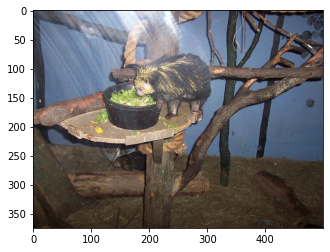

In [ ]:
# show the orignal image 
index = 1
input_image = Image.open(dataset.imgs[index][0]).convert('RGB')
plt.imshow(input_image)

In [ ]:
output = resnet34(dataset[index][0].view(1, 3, 224, 224))
values, indices = torch.topk(output, 3)
print("Top 3-classes:", indices[0].numpy(), [classes[x] for x in indices[0].numpy()])
print("Raw class scores:", values[0].detach().numpy())

Top 3-classes: [334 377 297] ['porcupine, hedgehog', 'marmoset', 'sloth bear, Melursus ursinus, Ursus ursinus']
Raw class scores: [11.207966  9.872369  7.254448]


### Grad-CAM 
* **Overview:** Given an image, and a category (‘tiger cat’) as input, we forward-propagate the image through the model to obtain the `raw class scores` before softmax. The gradients are set to zero for all classes except the desired class (tiger cat), which is set to 1. This signal is then backpropagated to the `rectified convolutional feature map` of interest, where we can compute the coarse Grad-CAM localization (blue heatmap).


* **To Do**: Define your own function Grad_CAM to achieve the visualization of the given images. For each image, choose the top-3 possible labels as the desired classes. Compare the heatmaps of the three classes, and conclude. 


* **Hints**: 
 + We need to record the output and grad_output of the feature maps to achieve Grad-CAM. In pytorch, the function `Hook` is defined for this purpose. Read the tutorial of [hook](https://pytorch.org/tutorials/beginner/former_torchies/nnft_tutorial.html#forward-and-backward-function-hooks) carefully. 
 + The pretrained model resnet34 doesn't have an activation function after its last layer, the output is indeed the `raw class scores`, you can use them directly. 
 + The size of feature maps is 7x7, so your heatmap will have the same size. You need to project the heatmap to the resized image (224x224, not the original one, before the normalization) to have a better observation. The function [`torch.nn.functional.interpolate`](https://pytorch.org/docs/stable/nn.functional.html?highlight=interpolate#torch.nn.functional.interpolate) may help.  
 + Here is the link of the paper [Grad-CAM: Visual Explanations from Deep Networks via Gradient-based Localization](https://arxiv.org/pdf/1610.02391.pdf)

![Grad-CAM](https://da2so.github.io/assets/post_img/2020-08-10-GradCAM/2.png)

We first implement a function that attachs two hooks to our model: a forward hook that stores the activation of the penultimate convolutional layer; and a backward hook that stores the gradients of the convolutional layers. Each of the two hooks stores the values in a dictionary dict_ using the respective keys: "activation" and "grads". We also write a function to remove all hooks from the model given the lists of their corresponding handles.

In [ ]:
def attach_hooks(forward_hook, backward_hook):
    """
    Attaches the mentionned hooks to the resnet34 model.
    Args:
      forward_hook (func): Forward hook
      backward_hook (func): Backward hook
    Output:
      fwd_handles (list): List of forward handles
      bckwd_handles (list): List of backward handles
    """
    # First, we instantiate lists which will contain the handles of the attached hooks
    fwd_handles, bckwd_handles = [], []

    # Attach both hooks to the penultimate convolutional layer of the model
    fwd_handle = resnet34.layer4[2].conv2.register_forward_hook(forward_hook)
    bckwd_handle = resnet34.layer4[2].conv2.register_full_backward_hook(backward_hook)

    # Add handles to the lists
    fwd_handles.append(fwd_handle)
    bckwd_handles.append(bckwd_handle)

    return fwd_handles, bckwd_handles

In [ ]:
def remove_hooks(fwd_handles, bckwd_handles):
    """
    Removes hooks from the model whose handles are given in the inputs.
    Args:
      fwd_handles (list): list of all handles corresponding to forward hooks.
      bckwd_handles (list): list of all handles corresponding to backward hooks.
    """
    for handle in fwd_handles:
      handle.remove()

    for handle in bckwd_handles:
      handle.remove()

We can now implement both the forward and backward hooks as mentionned above.

In [ ]:
# Implement forward hook
def feat_maps(self, input, output):
  """
  Returns penultimate feature maps when attached to the corresponding Convolutional layer.
  """
  dict_["activation"] = output

In [ ]:
# Implement backward hook
def feat_grads(self, grad_input, grad_output):
  """
  Returns penultimate feature map gradients when attached to the corresponding Convolutional layer.
  """
  dict_["grads"] = grad_output

Once hooks are attached to the model, we are able to compute the heatmaps of each data point with regards to its three most probable categories. We thus write a function taking an index of the dataset as input and computing the corresponding heatmaps, interpolated into a (224,224) size.

We use a preliminary function compute_heatmap which takes as input a dictionary containing two keys: "activation" and "grads". Computes the corresponding heatmap and returns it reshaped to (224,224) by interpolation.

In [ ]:
def compute_heatmap(dict_, interpolation_mode="bicubic"):
  """
  Args:
    dict_ (dictionary): should contain the activation and gradients of the penultimate convolutional layer.
    interpolation_mode (String): describes the interpolation method used when calling torch.nn.functional.interpolate.
  Output:
    heatmap (torch.Tensor): corresponding heatmap interpolated to size (224,224)
  """
  # Access activation and gradient maps
  activation, grads = dict_["activation"], dict_["grads"][0]

  # Compute feature map weights as the mean of the gradients of the coefficients of the corresponding feature map
  wc = grads.mean(dim=[2,3], keepdim=True)

  # Apply weights to the feature maps
  weighted_activation = wc * activation

  # Average all weighted feature maps and apply ReLU activation
  weighted_sum = weighted_activation.mean(dim=[1], keepdim=True)
  weighted_sum = nn.ReLU()(weighted_sum)

  # Interpolate to size (224,224)
  weighted_sum_interp = nn.functional.interpolate(weighted_sum, size=(224,224), mode=interpolation_mode)

  # Return as a squeezed numpy array
  return np.squeeze(weighted_sum_interp.detach().numpy())

In [ ]:
def compute_heatmaps(index):
    """
    Computes heatmaps for the three most probable categories predicted by the model.
    Args:
      index (int): index of the image in the dataset
    """
    # Access data and pass though model
    input_, label_ = dataset[index]
    output_ = resnet34(input_.view(1, 3, 224, 224)) # Triggers forward hook and stores feature map activation in dict_

    # Get 3 most probable classes predicted by the model
    values, indices = torch.topk(output_, 3)
    class_labels = [classes[x] for x in indices[0].numpy()]

    # Run through the 3 most predicted classes and use them as labels
    # Compute their corresponding heatmaps and store them in a list
    heatmaps = []
    for i in range(indices.shape[1]):
      output_[:,indices[0][i]].backward(retain_graph=True) # Run a backward pass on the class of interest

      # Compute corresponding heatmap
      heatmap = compute_heatmap(dict_)
      heatmaps.append(heatmap)
    
    return class_labels, heatmaps # Return class labels and heatmaps

We finally compute a plot function aiming to visualize heatmaps over their corresponding image. We then wrap the above functions in a for loop to run through all the dataset.

In [ ]:
def plot_heatmaps(index, class_labels, heatmaps):
  """
  Plots a figure overriding figures with the heatmaps computed using the functions above.
  Args:
    index (int): dataset index
    class_labels (list): list of top 3 classes
    heatmaps (list): heatmaps corresponding to top 3 classes
  """
  # Import image and apply transformations
  image = Image.open(dataset.imgs[index][0]).convert("RGB")
  image = transforms.Resize(256)(image)
  image = transforms.CenterCrop(224)(image)

  # Min-Max normalize heatmaps
  heatmaps[0] /= np.max(heatmaps[0])
  heatmaps[1] /= np.max(heatmaps[1])
  heatmaps[2] /= np.max(heatmaps[2])

  # Create figure and plot
  fig, axs = plt.subplots(1,3,figsize=(20,8))

  fig.suptitle(dataset.imgs[index][0])

  axs[0].imshow(image)
  axs[0].imshow(heatmaps[0], alpha=0.4, cmap='rainbow')
  axs[0].set_title(class_labels[0])

  axs[1].imshow(image)
  axs[1].imshow(heatmaps[1], alpha=0.4, cmap='rainbow')
  axs[1].set_title(class_labels[1])

  axs[2].imshow(image)
  axs[2].imshow(heatmaps[2], alpha=0.4, cmap='rainbow')
  axs[2].set_title(class_labels[2])

  plt.show()

### Main Wrapper

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:3635: UserWarning: Default upsampling behavior when mode=bicubic is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode)


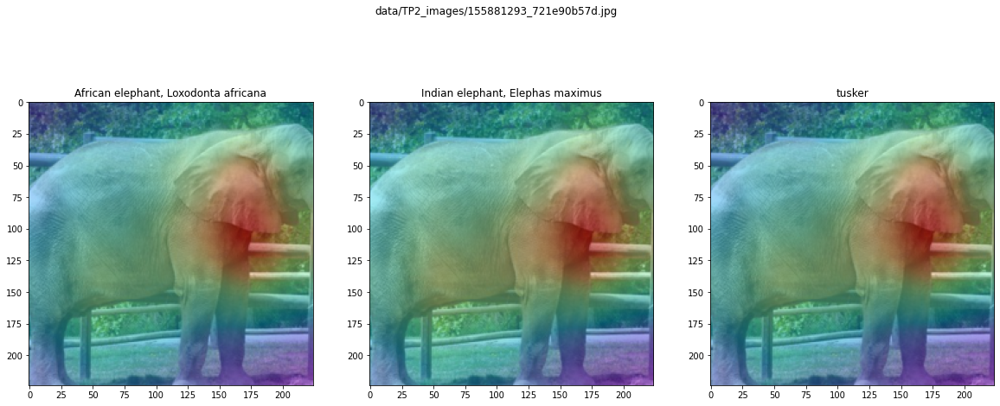

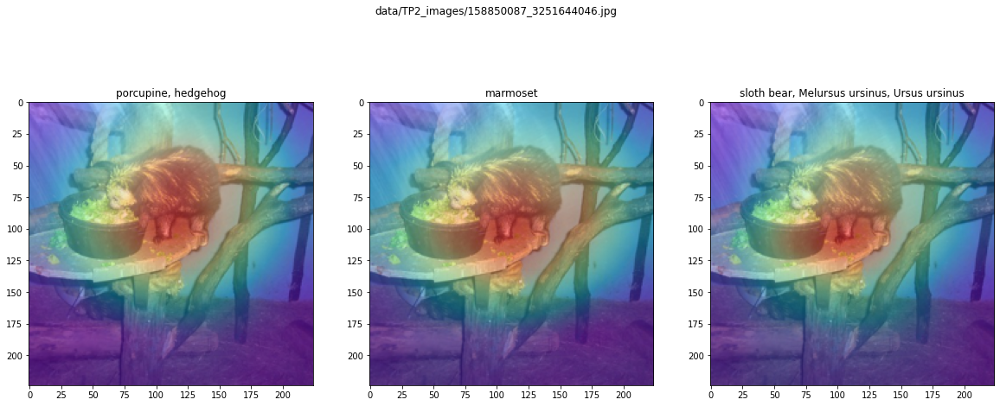

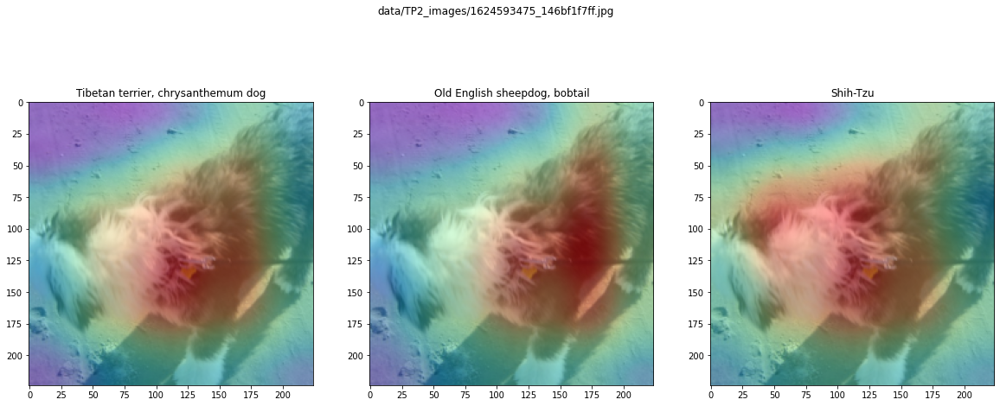

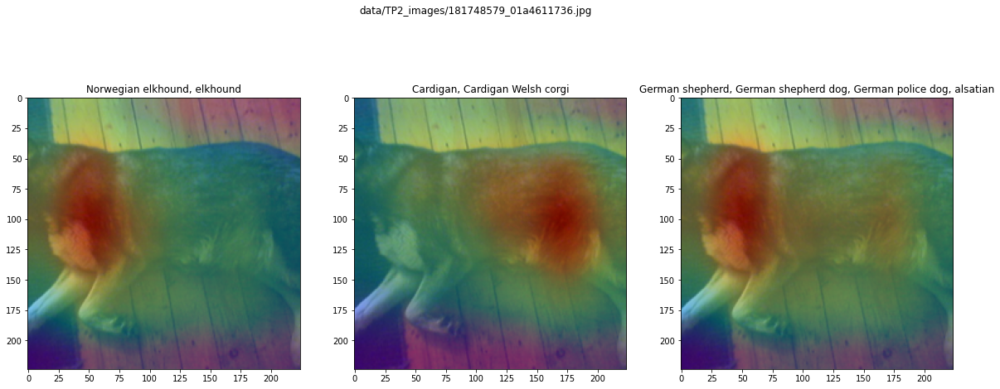

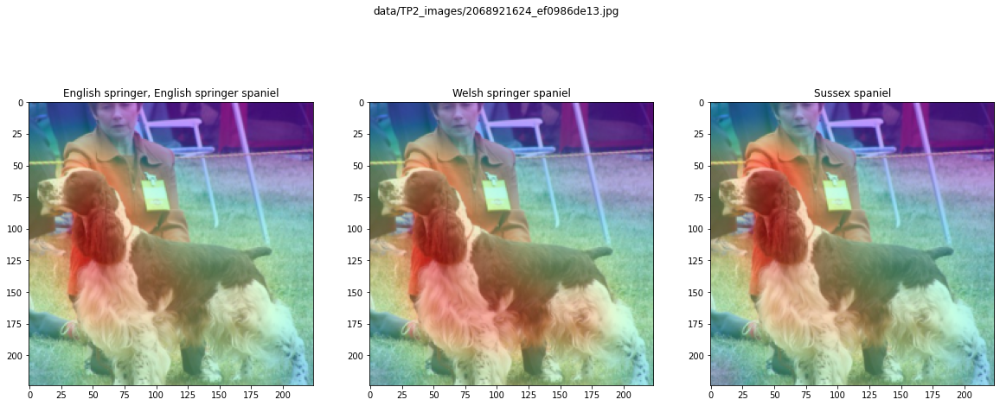

...

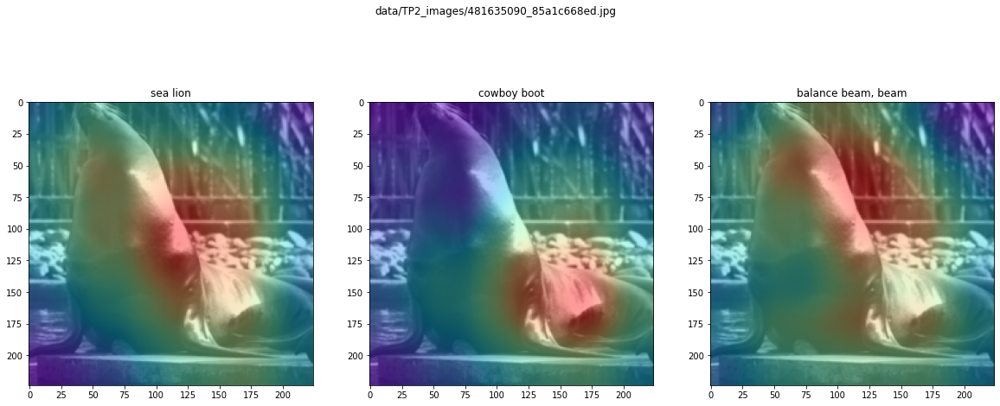

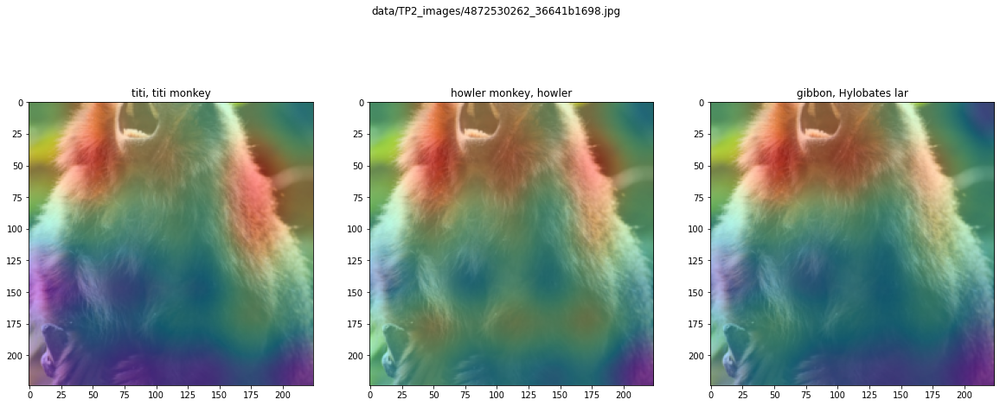

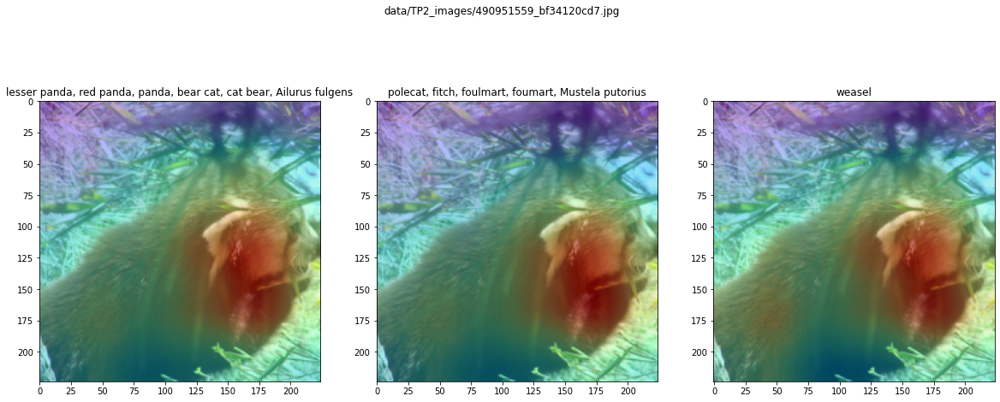

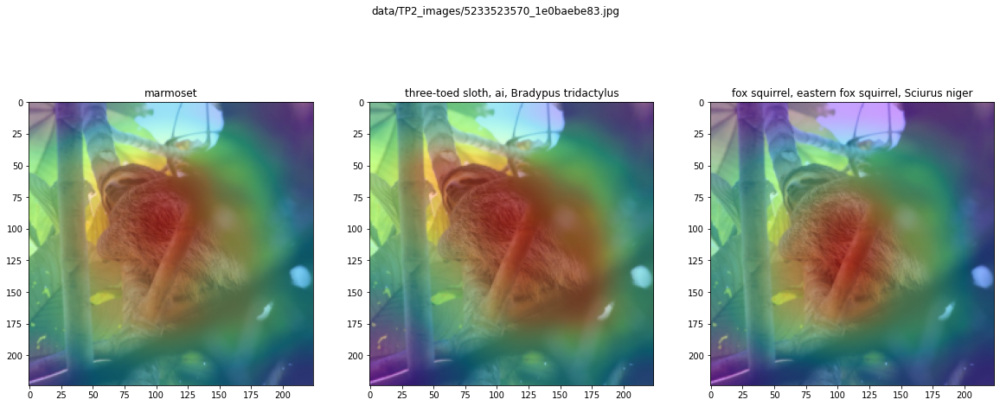

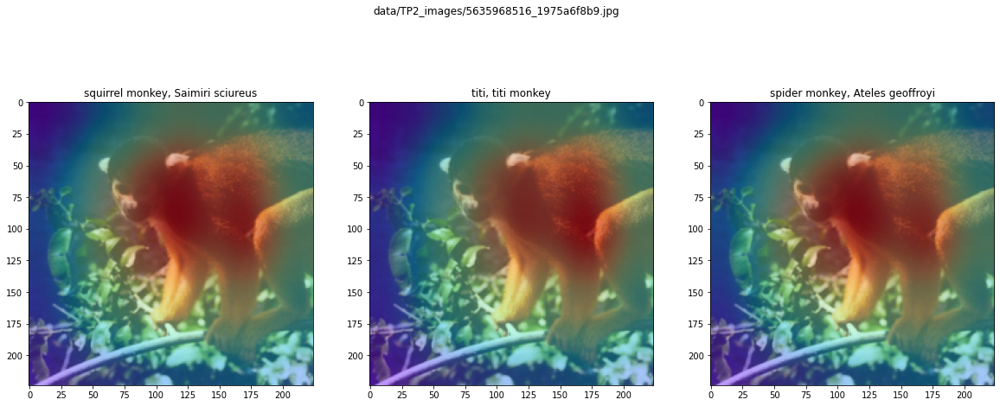

In [ ]:
# Make sure model is in evaluation mode
resnet34.eval()

# Attach hooks to the resnet34 model
fwd_handles, bckwd_handles = attach_hooks(feat_maps,feat_grads)
dict_ = {} # Instantiate dictionary containing hook values

# Run through dataset, compute and plot heatmaps
for index in range(len(dataset)):
  # Compute top 3 labels and corresponding heatmaps
  class_labels, heatmaps = compute_heatmaps(index)

  # Plot image and overlap with heatmaps
  plot_heatmaps(index, class_labels, heatmaps)

# Remove all hooks
remove_hooks(fwd_handles, bckwd_handles)

Results are extremely satisfying. Indeed, for each image and each corresponding top predicted category, the animals are extremely well highlighted with regards to the background.

We can make two main remarks: \\
First, for each image, the three heatmaps obtained are always very similar. This probably comes from the high granularity of classes the model deals with. Typically, an African Elephant, an Indian Elephant and a Tusker are similar animals and will naturally trigger similar activations of our feature maps. Thus, the three heatmaps obtained will be similar. Moreover, when the top 3 predicted categories are significantly different (e.g. European Gallinule, Mink and Scorpion), heatmaps become more distinct. \\
Second, the heatmaps obtained lack in precision. Indeed, we could expect from such a performing model to segment animals of an image with high precision. This is caused by the small size of feature maps of the penultimate convolutional layer (7,7) which decide of the size of heatmaps for Grad-Cam. Naturally, (7,7) size images interpolated to (224,224) images have low resolution and offer rough segmentations of the animals.